In [2]:
"""
This programme can be used if you have bounding boxes on your validation set. 
If you have just tagged your validation set (classification way), refer to the other Monobloc_evaluator

"""

'\nThis programmed can be used if you have bounding boxes on your validation set. \n\n'

In [1]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
import numpy as np

import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

import json

%matplotlib inline

In [2]:
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '../monoblocModels/v2-1/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'model/monobloc_label_map.pbtxt'

#json that our model will need to import validation data
PATH_TO_VALID = "data/valid.json"

#json that our model will need to import test data
PATH_TO_TEST = "data/test.json"

print(PATH_TO_LABELS)
print(PATH_TO_CKPT)
print(PATH_TO_VALID)

NUM_CLASSES = 1


model/monobloc_label_map.pbtxt
../monoblocModels/v2-1/frozen_inference_graph.pb


In [3]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [4]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(label_map)


item {
  name: "monobloc chair"
  id: 1
}



In [5]:
def updt(total, progress, info):
    """
    Show how a loop progress


    Parameters
    ----------
    total : int 
    maximum of the loop
    
    progress : int 
    the iterator
    
    info : string
    name of the loading bar

    Returns
    -------
    a loading bar
    

    """
    progress=progress+1
    barLength, status = 20, ""
    progress = float(progress) / float(total)
    if progress >= 1.:
        progress, status = 1, "\r\n"
    block = int(round(barLength * progress))
    text = "\r[{}] {:.0f}%, filename {}".format(
        "#" * block + "-" * (barLength - block), round(progress * 100, 0),
        status)
    sys.stdout.write(text + info)
    sys.stdout.flush()

In [6]:
def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    if (im_width*im_height,3)==np.array(image.getdata()).shape:
        return np.array(image.getdata()).reshape(
          (im_height, im_width, 3)).astype(np.uint8)
    else:
        return []

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

In [7]:
def make_dict(boxes):
    #Change a list of list of coordinates into a list of bbox dictionnaries
    assert boxes!=[]
    list_dict=[]
    

    for box in boxes:
        assert box[0]<box[2]
        assert box[1]<box[3]
        n_dict = {'x1':box[0],'x2':box[2],'y1':box[1],'y2':box[3]}
        list_dict.append(n_dict)

    return list_dict

In [8]:
def reshape_error(filenames):
    #Function to call if load_image_into_numpy_array doesn't work
    for path in filenames:
        print("Reshape error with the file {}, it will be ignored".format(path))

        i=f_gt.index(path)
        f_gt.remove(path)
        del b_gt[i]

In [9]:
def import_json(path, limit=7990272):
    
    """
    Import filenames and bounding boxes from path 



    Parameters
    ----------
    path : string
    Path to valid.json
    
    limit : int
    It's the maximum number of pixels that an image should have. It's optional, in order to make this step faster and/or
    prevent your computer from a lack of GPU to run it

    Returns
    -------
    filenames : String list
    List of image path we want to import
    
    boxes : List of list of Dictionnaries
    List of Bounding boxes stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    Each element from the first list is a list of predicted bounding box on one image

    """
    PATH_TO_DATA='../data'
    
    
    filenames=[]
    boxes=[]
    labels=[]
    with open(path, 'r') as f:
        jload = json.load(f)
        
    for temp,data in enumerate(jload):
        
        seq=(PATH_TO_DATA, data["filename"])
        img_path="/".join(seq)
        updt(len(jload),temp,img_path)
        
        if (data["object"]=={}):
            filenames.append(img_path)
            boxes.append([{}])
            labels.append([])
            
        else :
            if (data["object"]["count"]==0):
                filenames.append(img_path)
                boxes.append([{}])
                labels.append([])
            else:
                b_list=[]
                nb_boxes=data["object"]["count"]
                if(data["height"]*data["width"]>=limit):
                    print("\n WARNING : picture {} is too big. We won't import this image".format(img_path))
                else:
                    for i in range (nb_boxes):
                        b_list.append([data["object"]["bbox"]["xmin"][i],data["object"]["bbox"]["ymin"][i],data["object"]["bbox"]["xmax"][i],data["object"]["bbox"]["ymax"][i]])
                    n_dict=make_dict(b_list)
                    
                    filenames.append(img_path)
                    boxes.append(n_dict.copy())
                    labels.append(data["object"]["bbox"]["label"].copy())
         
            
            
    return filenames, boxes, labels


In [10]:
def save_boxes_and_scores(image_paths, threshold=0.1):
    """
    make predictions of every images and return them 


    Parameters
    ----------
    image_paths : List of strings
    Path to images
    
    threshold : float between 0 and 1
    The minimum score limit. We keep every bounding box with a score higher than the threshold
    
    Returns
    -------
    list_filenames : String list
    List of image path we predicted
    
    list_boxes : List of list of dictionnaries
    List of Bounding boxes predicted per images, stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    
    list_scores : List of list of float
    List of each prediction's scores per images

    """
    
    list_filenames=[]
    list_scores=[]
    list_boxes=[]
    list_labels=[]
    error_file=[]
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Definite input and output Tensors for detection_graph
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Each box represents a part of the image where a particular object was detected.
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            
            
            for temp,image_path in enumerate(image_paths):
                updt(len(image_paths),temp,image_path)
                image = Image.open(image_path)
                # the array based representation of the image will be used later in order to prepare the
                # result image with boxes and labels on it.
                image_np = load_image_into_numpy_array(image)
                if len(image_np)==0:
                    error_file.append(image_path)
                    continue
                # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)
                # Actual detection.
                (boxes, scores, labels, num) = sess.run([detection_boxes, 
                                                          detection_scores, 
                                                          detection_classes, 
                                                          num_detections],feed_dict={image_tensor: image_np_expanded})
                #scores =[ [score classe 0] [score classe 1 ] etc... ]
                #boxes = [[bbox1] [bbox2] etc...]

                #We keep the prediction switchin the chosen threshold
                s=[]
                b=[]
                d={}
                l=[]
                #We look at each class
                for j in range len(scores):
                    #Then at each box of each class
                    for i in range (len(scores[j])): 
                        if (scores[j][i]>=threshold):
                            s.append(scores[j][i])
                            b.append(boxes[j][i]) 
                            l.append(labels[j][i])
                if (b==[]):
                    d=[{}]
                else :
                    d=make_dict(b)
                list_scores.append(s.copy())
                list_boxes.append(d.copy())
                list_labels.append(l.copy())
                list_filenames.append(image_path)
                
            reshape_error(error_file)

                
    return list_filenames, list_scores, list_boxes, list_labels

In [11]:
global f_gt
global b_gt

f_valid, b_valid, l_valid = import_json(PATH_TO_VALID)
f_test, b_test, l_test = import_json(PATH_TO_TEST)
f_gt=f_valid+f_test
b_gt=b_valid+b_test
l_gt=l_valid+l_test
filenames, scores, boxes, labels = save_boxes_and_scores(f_gt,0.2)


[--------------------] 1%, filename data/Images+json/img/monobloc (9)_NstM9SXqOD.png
[###-----------------] 14%, filename data/Images+json/img/monobloc (44)_pZrvWY8nJp.png
[####----------------] 21%, filename data/Images+json/img/monobloc (329).pngiA7X52.pngg
[####----------------] 22%, filename data/Images+json/img/monobloc (329)_VXTPQcXB6y.png
[######--------------] 29%, filename data/Images+json/img/monobloc (303)_BjQlMkXeH1.png
[######--------------] 30%, filename data/Images+json/img/monobloc (306)_JNSLiv3CMV.png
[####################] 100%, filename data/Images+json/img/000000007386.jpgtu6N2XND.png
[##------------------] 9%, filename data/Images+json/img/monobloc (44)_7b4xxcloQA.png
[#####---------------] 26%, filename data/Images+json/img/monobloc (306).pngtQ0esPs.png
[#####---------------] 26%, filename data/Images+json/img/monobloc (306)_Gj4JEB4XJR.jpg
[######--------------] 31%, filename data/Images+json/img/monobloc (278)_BmjlPjhQZP.png
[########------------] 38%, filename d

In [19]:
def img_classifier(b_gt):
    
    """
    Just to know how many positive images are present in the validation set:
    """
        
    imgpos=0
    imgneg=0

    for i in range (len(b_gt)):
        if b_gt[i]==[{}]:
            imgneg+=1
        else:
            imgpos+=1
    print(" The validation dataset contains {} positive images and {} negative images \n".format(imgpos, imgneg))

In [1]:
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [ ]:
def is_corresponding_box(boxes1,labels1,boxes2,labels2,thresholdIoU=0.5):
    """
    This function looks to two list of boxes, and compare them
    If there is a box in boxes1 that correspond to a box in boxes2 switchin the IoUThreshold AND the label, return True
    else, that means that no box correspond, so return False
    """
    for box1,label1 in zip(boxes1,labels1):
        for box2,label2 in zip(boxes2,labels2):
            if getIou(box1,box2)>=thresholdIoU and label1==label2:
                return True
    return False
        
        

In [1]:
def img_posneg(filenames,scores,boxes1,boxes2,labels1,labels2,thresholdScore=0.6,thresholdIoU=0.5):
    
    """
    calculate the number of True Positive, True Negative, False Positive and False Negative images

    Parameters
    ----------
    filenames : List of string
    List of every image path contained in the validation set
    
    scores : List of list of float
    List of list of predicted scores
    
    boxes1 : List of list of dictionnaries
    List of list of bounding boxes predicted, stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
        
    boxes2 : List of list of dictionnaries
    List of list of groundtruth bounding boxes, stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    
    Returns
    -------
    tp : int
    number of true positive boxes (boxes well predicted)
    
    fn : int
    number of false negative boxes (the researched object is present, but not found by the model)
    
    fp : int
    number of false positive boxes (object detected where there is nothing interesting)
    
    tn : int
    number of true negative boxes (no boxes predicted where there is no monobloc chair)
    
    error_path : list of string
    list of path where our model failed to predict
    
    error_reason : list of string
    list of string. strings are "false positive" or "false negative"
    
    """
    
    assert threshold<=1
    assert threshold>=0
     
    #boxes2 = b_gt and threshold is the value that determine know if the model identified a monobloc
    tp, fn, fp, tn = 0, 0, 0, 0
    error_path=[]
    error_reason=[]
    
    for i in range (len(filenames)):
        
        if (scores[i]==[]):
            if boxes2[i]==[{}]:
                tn+=1
            
            else:
                fn+=1
                error_reason.append("False negative image")
                error_path.append(filenames[i])
            
        else:
            if (max(scores[i])>thresholdScore):
                if boxes2[i]!=[{}]:
                    if is_corresponding_box(boxes1,labels1,boxes2,labels2,thresholdIoU):
                        tp+=1
                    else:
                        fp+=1
                        error_reason.append("False positive image")
                        error_path.append(filenames[i])   
                else:
                    fp+=1
                    error_reason.append("False positive image")
                    error_path.append(filenames[i])
            else :
                if boxes2[i]==[{}]:
                    tn+=1
                else:
                    fn+=1
                    error_reason.append("False negative image")
                    error_path.append(filenames[i])
                
    
    return tp, fn, fp, tn, error_path, error_reason
    

In [21]:
def print_pred(image_paths,titles, IMAGE_SIZE=(12, 8)):
    
    """
    Print with predicted bounding boxes, images where our model failed to predict correctly

    Parameters
    ----------
    image_paths : List of string
    List of path where our model failed the prediction
    
    titles : List of string
    List of reason of prediction failure

    """
    
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Definite input and output Tensors for detection_graph
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Each box represents a part of the image where a particular object was detected.
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            
            temp=0
            for image_path, title in zip(image_paths, titles):
                updt(len(image_paths),temp,image_path)
                image = Image.open(image_path)
                # the array based representation of the image will be used later in order to prepare the
                # result image with boxes and labels on it.
                image_np = load_image_into_numpy_array(image)
                # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)
                # Actual detection.
                (boxes, scores, classes, num) = sess.run([detection_boxes, 
                                                          detection_scores, 
                                                          detection_classes, 
                                                          num_detections],feed_dict={image_tensor: image_np_expanded})
                # Visualization of the results of a detection.
                vis_util.visualize_boxes_and_labels_on_image_array(image_np,
                                                                   np.squeeze(boxes),
                                                                   np.squeeze(classes).astype(np.int32),
                                                                   np.squeeze(scores),
                                                                   category_index,
                                                                   min_score_thresh=.2,
                                                                   use_normalized_coordinates=True,
                                                                   line_thickness=3)
                plt.figure(figsize=IMAGE_SIZE)
                plt.title(title)
                plt.imshow(image_np)
                temp+=1

 The validation dataset contains 305 positive images and 142 negative images 

[#########-----------] 47%, filename data/Images+json/img/monobloc (195)_9ynV1RyqsN.png

/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[####################] 100%, filename ata/Images+json/img/monobloc (117)_g7VqQqWE7k.png
data/Images+json/img/monobloc (102)_dxmMYz5UTi.png
 Confusion Matrix about 'Is there at least one monobloc in this image?' with threshold score>0.8 : 
 Percentage of True Positive : 58.16554809843401% 
 Percentage of False Positive : 0.44742729306487694% 
 Percentage of True Negative : 31.319910514541387% 
 Percentage of False Negative : 10.06711409395973%
Which means that 400 images well predicted against 47 miss predicted


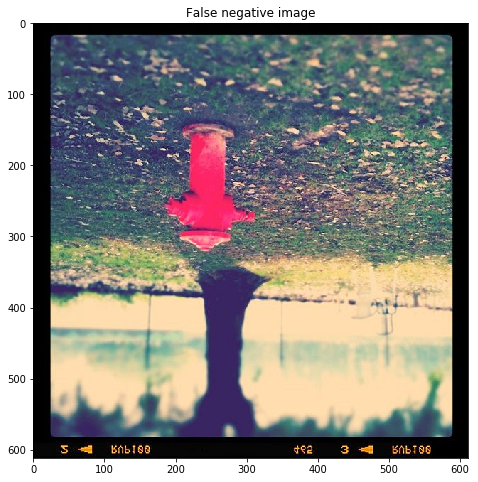

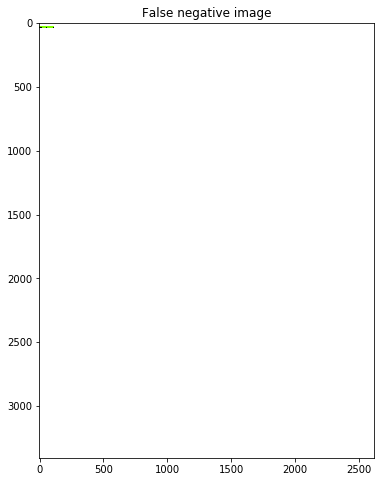

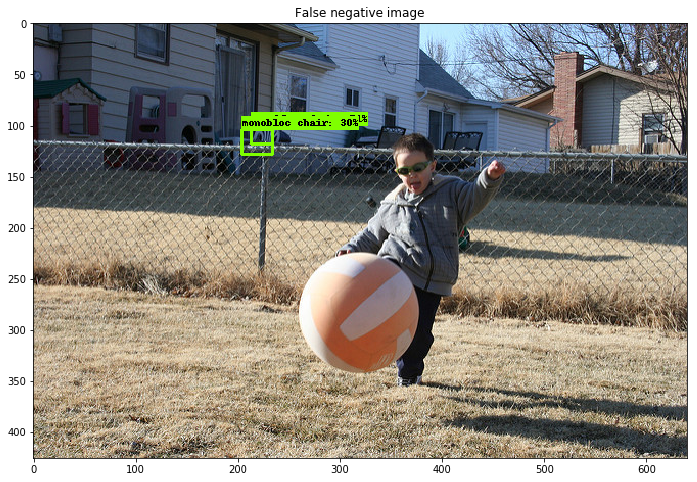

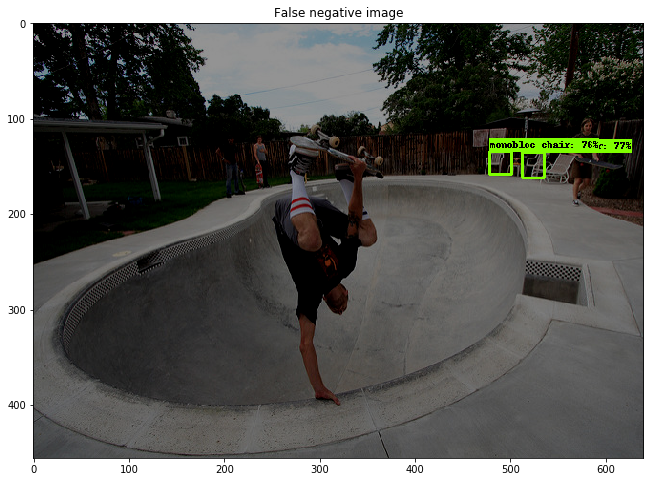

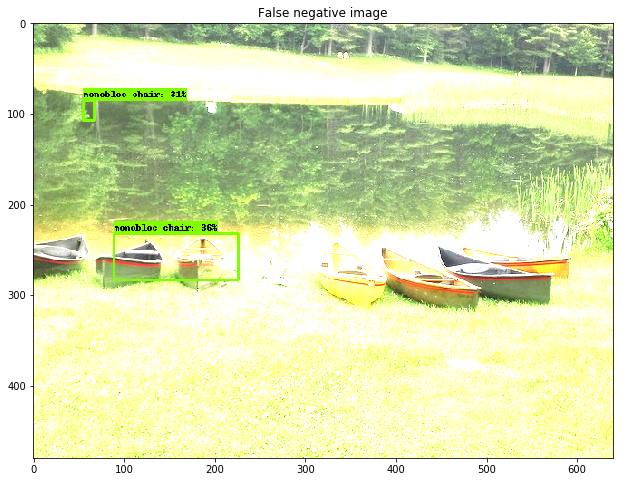

...

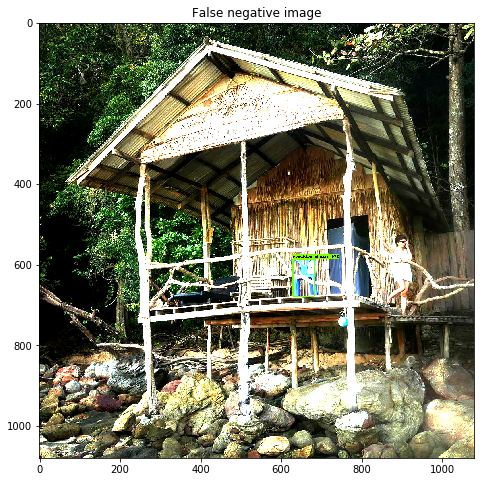

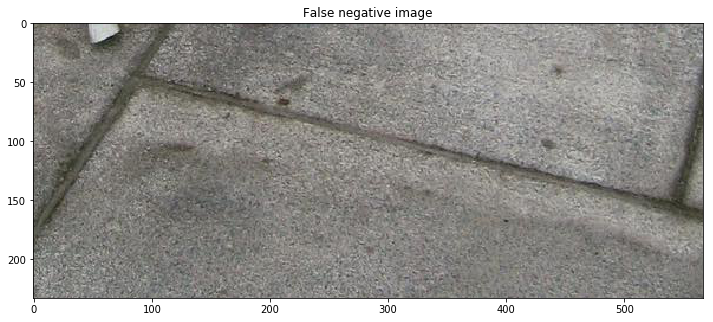

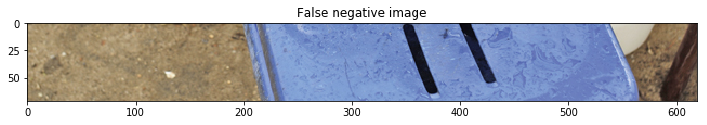

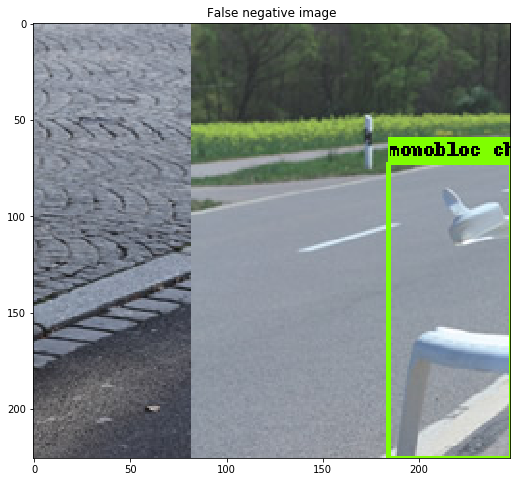

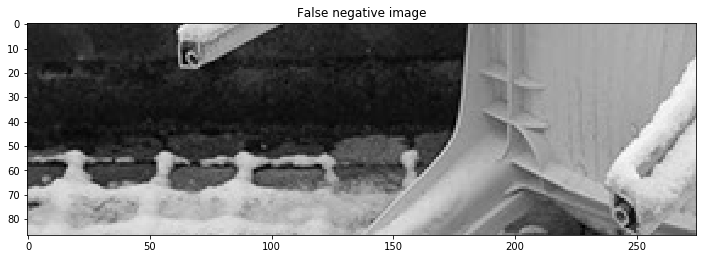

In [22]:
#To print the confusion matrix if an image contain a Monobloc chair
threshold=0.8
img_classifier(b_gt) 
tp, fn, fp, tn, error_path, error_reason = img_posneg(filenames,scores,boxes,b_gt,threshold)
print_pred(error_path,error_reason)

print("\n Confusion Matrix about 'Is there at least one monobloc in this image?' with threshold score>{} : \n Percentage of True Positive : {}% \n Percentage of False Positive : {}% \n Percentage of True Negative : {}% \n Percentage of False Negative : {}%".format(threshold,tp/(tp+fn+fp+tn)*100,fp/(tp+fn+fp+tn)*100,tn/(tp+fn+fp+tn)*100,fn/(tp+fn+fp+tn)*100))
print("Which means that {} images well predicted against {} miss predicted".format(tp+tn,fp+fn))

In [23]:
def img_graph(filenames,scores,boxes,b_gt):

    """
    Print false neg and false pos curves switchin several score threshold
    
    Parameters
    ----------
    filenames : List of string
    List of every image path contained in the validation set
    
    scores : List of list of float
    List of list of predicted scores
    
    boxes : List of list of dictionnaries
    List of list of Bounding boxes predicted, stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
        
    b_gt : List of list of dictionnaries
    List of list of groundtruth bounding boxes, stocked in dictionnaries this way:
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    """
    
    thresholds=np.arange(0.2,1,0.05)
    list_fn=[]
    list_fp=[]
    both=[]
    
    for threshold in thresholds:
        tp, fn, fp, tn, caca, prout = img_posneg(filenames,scores,boxes,b_gt,threshold)
        list_fn.append(fn/len(filenames))
        list_fp.append(fp/len(filenames))
        both.append((fp+fn)/len(filenames))
    plt.figure(figsize=IMAGE_SIZE)
    plt.title("false positive(-.), false negative(--) and sum(line) curves according to several score thresholds")
    plt.xlabel("minimum score thresholds")
    plt.ylabel("number of false images in percent")
    plt.plot(thresholds, list_fn,'r--', thresholds, list_fp,'b-.', thresholds, both, 'g')
    plt.show()
    

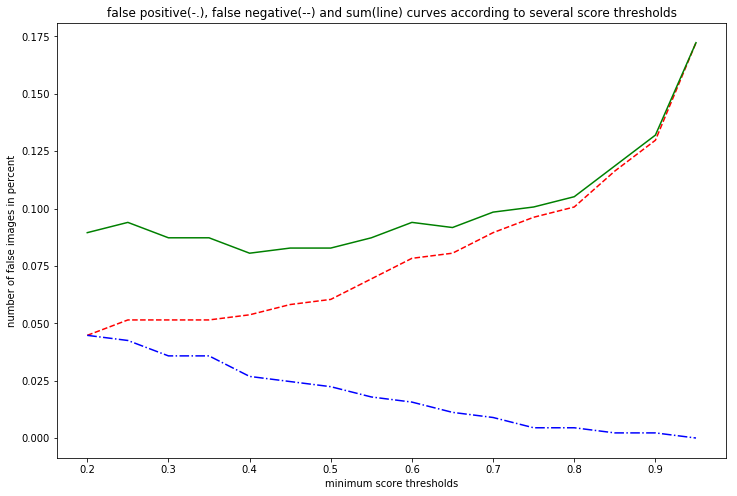

In [24]:
img_graph(filenames,scores,boxes,b_gt)